All necessary Libraries

In [4]:
#necessary Libraries
import numpy as np
import cv2
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
import glob
from skimage.io import imread_collection

from sklearn.datasets import fetch_openml
from sklearn.model_selection import train_test_split

Loading the data from MNIST

In [5]:
# Load MNIST dataset
X, y = fetch_openml(name='mnist_784', return_X_y=True, as_frame=False)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reassign variables for training
X_train_mnist = X
y_train_mnist = y

print("Shape of X: ", X.shape)
print("Shape of y: ", y.shape)

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


Shape of X:  (70000, 784)
Shape of y:  (70000,)


In [7]:
#mounting google drive to get images
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Used RandomForestClassifier for traing

In [8]:
from sklearn.ensemble import RandomForestClassifier

# Initializing and training using Random Forest classifier
my_classifier = RandomForestClassifier()
my_classifier.fit(X_train_mnist, y_train_mnist)

RandomForestClassifier()

To print and check the accuracy

In [9]:
from sklearn.metrics import accuracy_score

# To get accuracy on training data
y_train_pred = my_classifier.predict(X_train_mnist)
train_accuracy = accuracy_score(y_train_mnist, y_train_pred)
print("Accuracy on training data: ", train_accuracy)

Accuracy on training data:  1.0


Here I putted all the same image from 000 to 009 in a folder "single"

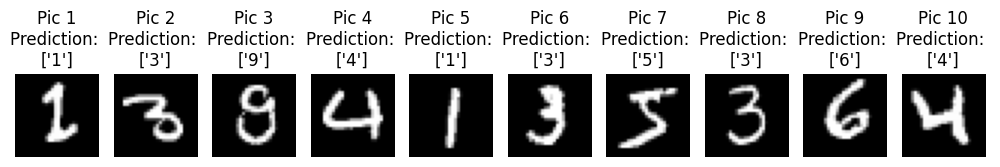

In [10]:
# Load and process individual test images (I putted all images (001 to 009) in a single folder)
image_paths = glob.glob("/content/drive/MyDrive/Projects/machine_learning/Number_Test_Data/single/*.png")

images = []

fig, axes = plt.subplots(1, len(image_paths), figsize=(10, 5))

for i, path in enumerate(image_paths):
    image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    flattened_image = image.flatten()
    images.append(flattened_image)

    predicted_label = my_classifier.predict(flattened_image.reshape(1, -1))

    axes[i].imshow(image, cmap='gray')
    axes[i].axis('off')
    axes[i].set_title(f"Pic {i+1}\nPrediction: \n{predicted_label}")

plt.tight_layout()
plt.show()

This code is for recognizing the number from image 010

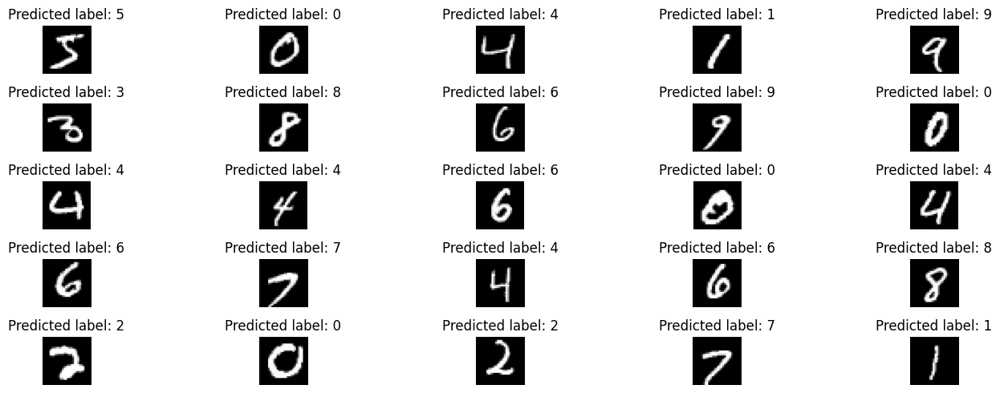

In [11]:
# Process image no.10
image_path = "/content/drive/MyDrive/Projects/machine_learning/Number_Test_Data/010.png"
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Threshold the image to segment the numbers
_, binary_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

# Find contours to extract individual cells
contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Function to sort contours
def sort_contours(contours):
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]
    (contours, bounding_boxes) = zip(*sorted(zip(contours, bounding_boxes), key=lambda b: (b[1][1], b[1][0])))
    return contours

# Sort contours
contours = sort_contours(contours)

# Function to extract cells from contours
def extract_cells(image, contours):
    cells = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        cell = image[y:y+h, x:x+w]
        cells.append(cell)
    return cells

# Extract cells
cells = extract_cells(image, contours)

# Predict labels for cells
predicted_labels = []
for cell in cells:
    resized_cell = cv2.resize(cell, (28, 28))
    processed_cell = resized_cell.reshape(1, -1)

    predicted_label = my_classifier.predict(processed_cell)
    predicted_labels.append(predicted_label[0])

# Display results
num_columns = 5
num_rows = len(predicted_labels) // num_columns + (len(predicted_labels) % num_columns > 0)

plt.figure(figsize=(15, 5))
for i, (cell, label) in enumerate(zip(cells, predicted_labels), 1):
    plt.subplot(num_rows, num_columns, i)
    plt.imshow(cell, cmap='gray')
    plt.title(f"Predicted label: {label}")
    plt.axis('off')

plt.tight_layout()
plt.show()

This code is for get the numbers and mark with yellow rectangle from image 011

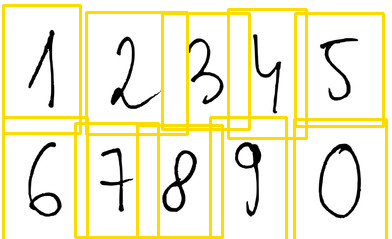

In [12]:
# Process for image 011
image = cv2.imread('/content/drive/MyDrive/Projects/machine_learning/Number_Test_Data/011.png')
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

_, thresh = cv2.threshold(gray_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=lambda x: cv2.boundingRect(x)[0])

c = 25
cut_images = []

for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(image, (x-c, y-c), (x + w + c, y + h + c), (0, 220, 250), 2)
    digit = gray_image[y-c:y+h+c, x-c:x+w+c]
    resized_digit = cv2.resize(digit, (28, 28))
    cut_images.append(resized_digit)

cv2_imshow(image)

Output for image 011

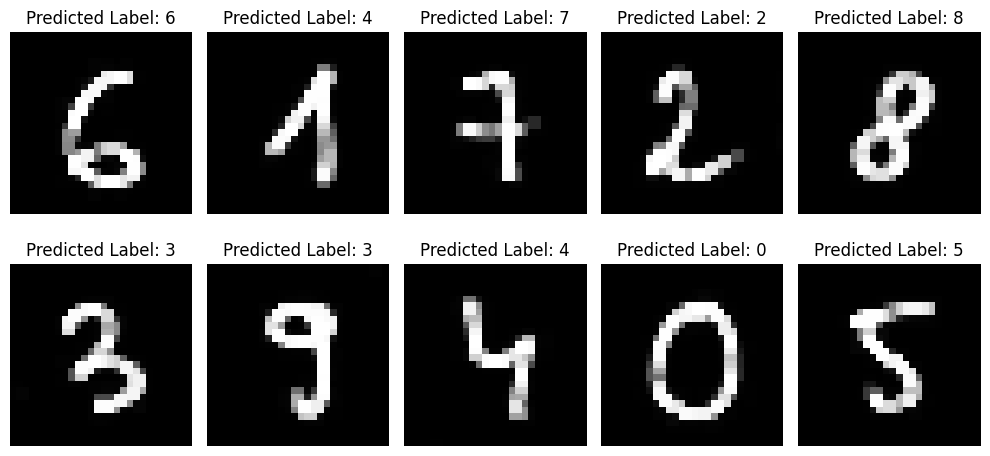

In [14]:
# Display individual digits
num_images = len(cut_images)
num_columns = 5
num_rows = (num_images + num_columns - 1) // num_columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 5))

if num_rows == 1:
    axes = axes.reshape(1, -1)

for i, (box, ax) in enumerate(zip(cut_images, axes.flatten())):
    box = 255 - box

    kernel = np.ones((2, 2), np.uint8)
    box = cv2.dilate(box, kernel, iterations=1)
    testX = box.reshape((1, -1))
    predicted_label = my_classifier.predict(testX)
    predicted_labels.append(predicted_label[0])

    ax.imshow(box, cmap='gray')
    ax.set_title(f"Predicted Label: {predicted_label[0]}", fontsize=12)
    ax.axis('off')

plt.tight_layout()
plt.show()

This code is to get the number which is handwritten on a book

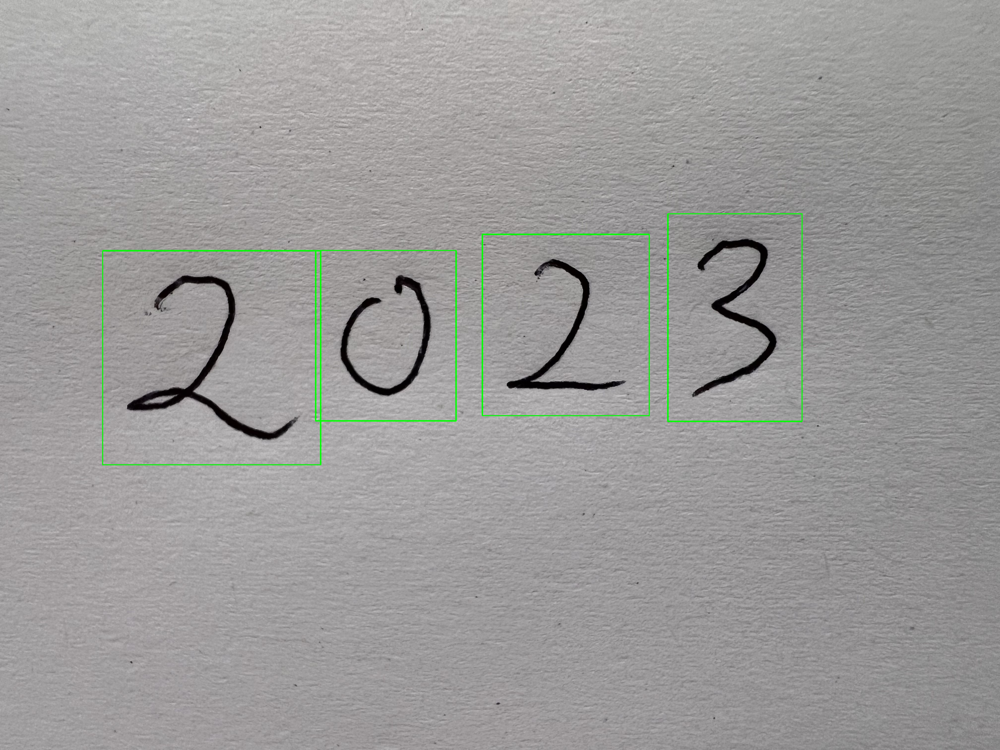

In [21]:

#image 012
image = cv2.imread('/content/drive/MyDrive/Projects/machine_learning/Number_Test_Data/012.png')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
blurred = cv2.GaussianBlur(gray, (25, 25), 0)

_, binary_image = cv2.threshold(blurred, 150, 200, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=lambda x: cv2.boundingRect(x)[0])

cut_images_1 = []

is_near = []
pre_x = 0
pre_y = 0
pre_w = 0
pre_h = 0

c = 100
d = 1000

for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    if math.sqrt((((x + w/2) - (pre_x + pre_w/2))**2 + ((y + h/2) - (pre_y + pre_h/2))**2)) <= d:
        is_near.append(1)
    else:
        is_near.append(0)

    cv2.rectangle(image, (x-c, y-c), (x + w + c, y + h + c), (0, 255, 0), 3)

    digit = binary_image[y-c:y+h+c, x-c:x+w+c]
    resized_digit = cv2.resize(digit, (28, 28))
    cut_images_1.append(resized_digit)

    pre_x, pre_y, pre_w, pre_h = x, y, w, h

cv2_imshow(image)

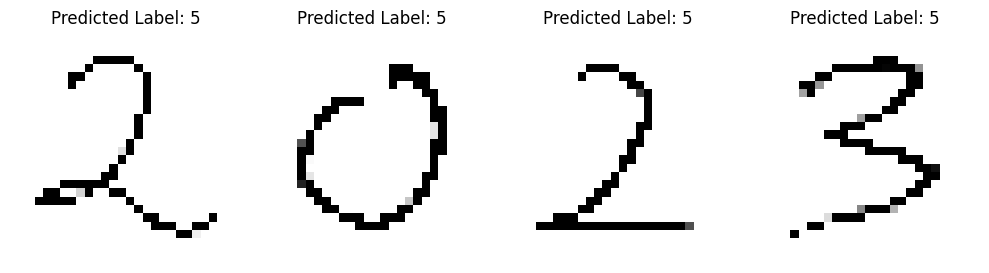

In [24]:
# Display Image 12 output
num_images = len(cut_images_1)
num_columns = 4
num_rows = (num_images + num_columns - 1) // num_columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 5))

if num_rows == 1:
    axes = axes.reshape(1, -1)

for i, (box, ax) in enumerate(zip(cut_images_1, axes.flatten())):
    box = 255 - box

    kernel = np.ones((1, 1), np.uint8)
    box = cv2.dilate(box, kernel, iterations=1)
    testX = box.reshape((1, -1))
    predicted_label = my_classifier.predict(testX)
    predicted_labels.append(predicted_label[0])

    ax.imshow(box, cmap='gray')
    ax.set_title(f"Predicted Label: {predicted_labels[0]}", fontsize=12)
    ax.axis('off')

    output.append(predicted_labels[0])

plt.tight_layout()
plt.show()

this code is for change the invert the background color and fill white color in to the coloful numbers

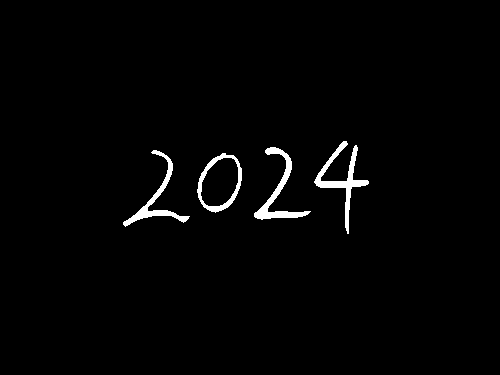

In [36]:

# for image 013
image = cv2.imread('/content/drive/MyDrive/Projects/machine_learning/Number_Test_Data/013.png')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, binary_image = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

kernel = np.ones((3, 5), np.uint8)
image2 = cv2.erode(binary_image, kernel, iterations=1)
cv2_imshow(image2)


To detetct the number 2 0 2 4

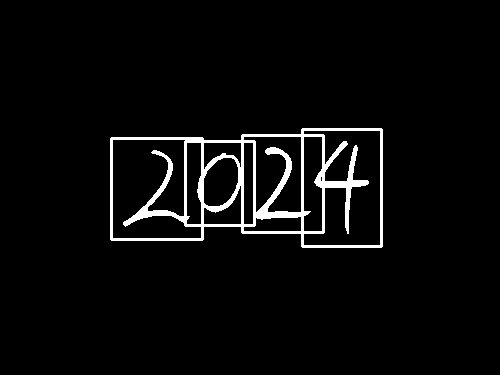

In [37]:

gray_image = image2

contours, _ = cv2.findContours(image2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contours = sorted(contours, key=lambda x: cv2.boundingRect(x)[0])

c = 12
cut_images = []

for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(gray_image, (x-c, y-c), (x + w + c, y + h + c), (255, 255, 255), 2)
    digit = gray_image[y-c:y+h+c, x-c:x+w+c]
    resized_digit = cv2.resize(digit, (28, 28))
    cut_images.append(resized_digit)

cv2_imshow(gray_image)

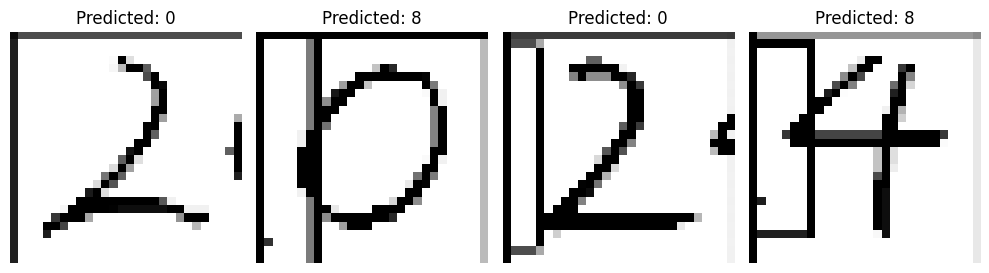

In [38]:

# Display individual segmented digits
num_images = len(cut_images)
num_columns = 4
num_rows = (num_images + num_columns - 1) // num_columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 5))

if num_rows == 1:
    axes = axes.reshape(1, -1)

predicted_labels = []
for i, (box, ax) in enumerate(zip(cut_images, axes.flatten())):
    box = 255 - box

    kernel = np.ones((1, 1), np.uint8)
    box = cv2.dilate(box, kernel, iterations=1)
    testX = np.reshape(box, (1, -1))
    predicted_label = my_classifier.predict(testX)
    predicted_labels.append(predicted_label[0])

    ax.imshow(box, cmap='gray')
    ax.set_title(f"Predicted: {predicted_label[0]}", fontsize=12)
    ax.axis('off')

plt.tight_layout()
plt.show()


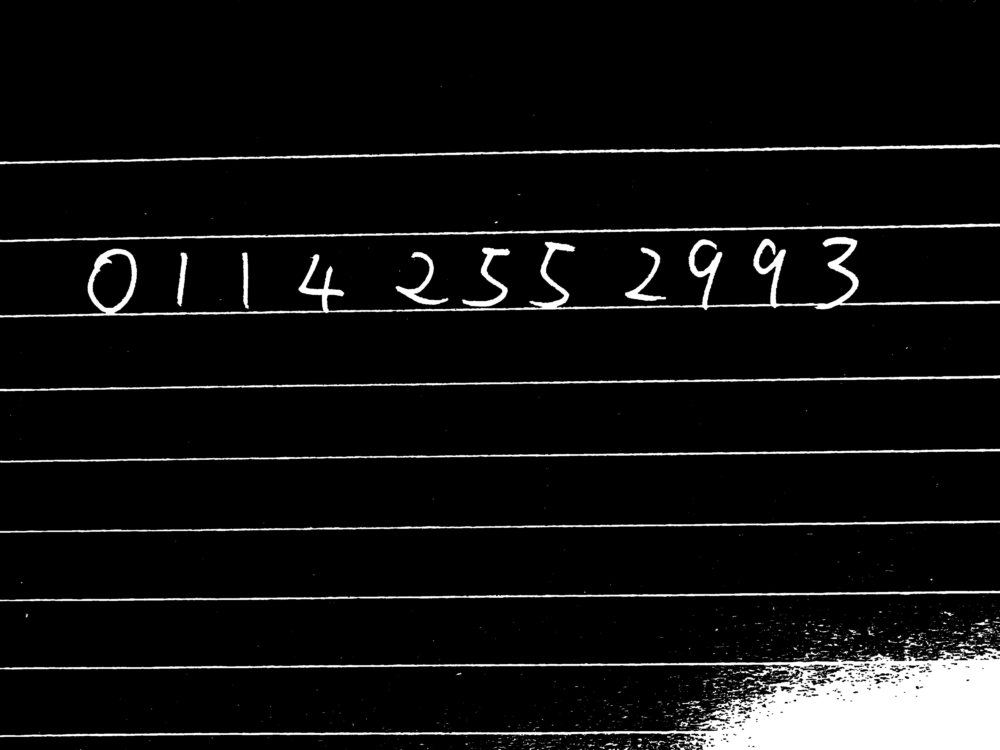

In [57]:

# for image 014
image = cv2.imread('/content/drive/MyDrive/Projects/machine_learning/Number_Test_Data/014.png')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, binary_image = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

kernel = np.ones((3, 5), np.uint8)
image2 = cv2.erode(binary_image, kernel, iterations=1)
cv2_imshow(image2)


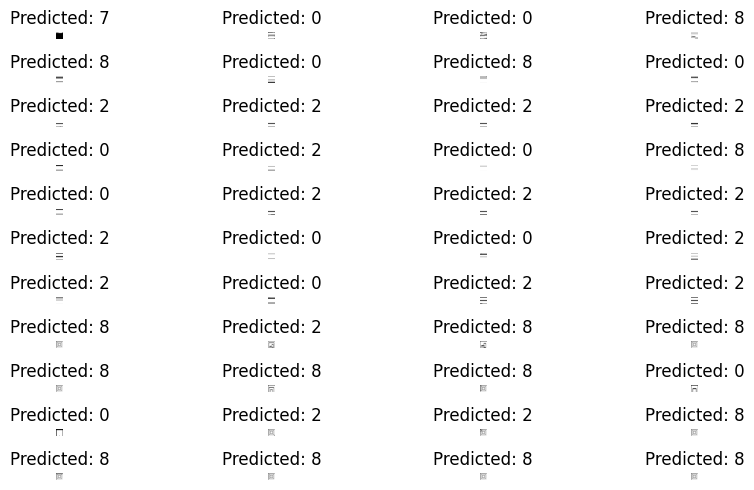

In [59]:
num_images = len(cut_images)
num_columns = 4
num_rows = (num_images + num_columns - 1) // num_columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 5))

if num_rows == 1:
    axes = axes.reshape(1, -1)

predicted_labels = []
for i, (box, ax) in enumerate(zip(cut_images, axes.flatten())):
    box = 255 - box

    kernel = np.ones((1, 1), np.uint8)
    box = cv2.dilate(box, kernel, iterations=1)
    testX = np.reshape(box, (1, -1))
    predicted_label = my_classifier.predict(testX)
    predicted_labels.append(predicted_label[0])

    ax.imshow(box, cmap='gray')
    ax.set_title(f"Predicted: {predicted_label[0]}", fontsize=12)
    ax.axis('off')

plt.tight_layout()
plt.show()


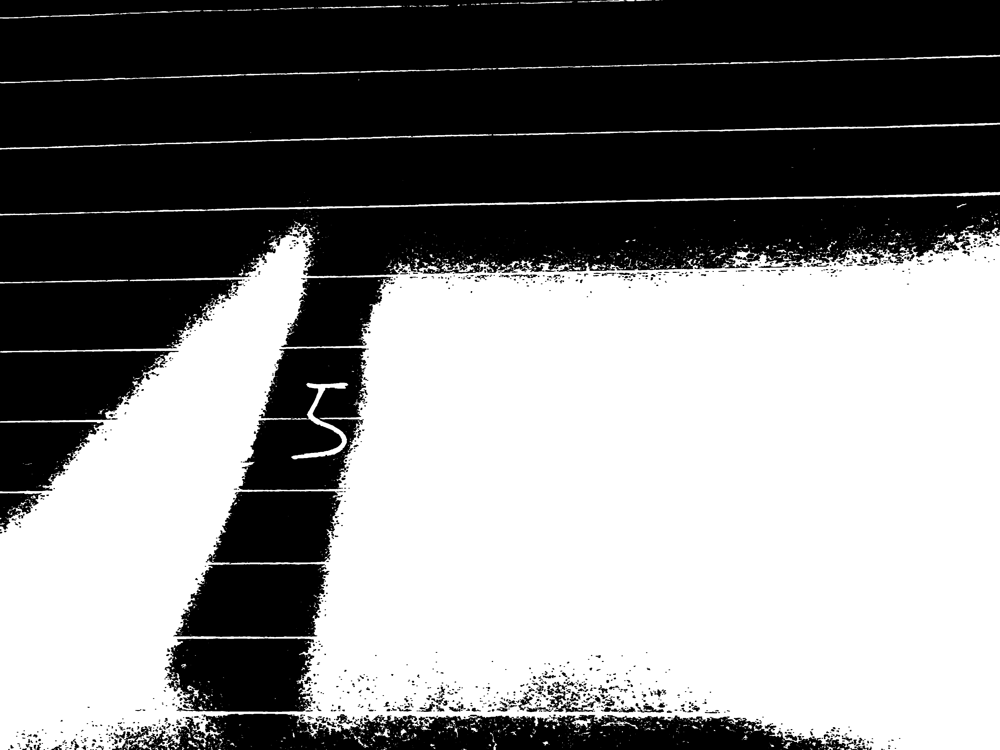

In [58]:

# for image 014
image = cv2.imread('/content/drive/MyDrive/Projects/machine_learning/Number_Test_Data/015.png')

gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, binary_image = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

kernel = np.ones((3, 5), np.uint8)
image2 = cv2.erode(binary_image, kernel, iterations=1)
cv2_imshow(image2)


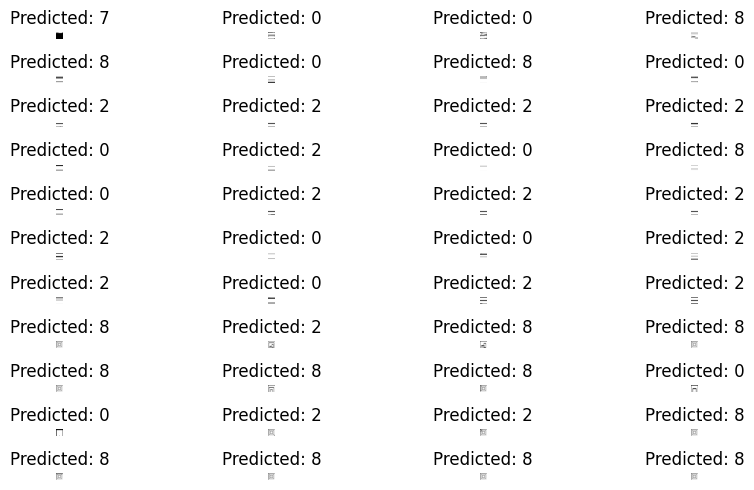

In [60]:
num_images = len(cut_images)
num_columns = 4
num_rows = (num_images + num_columns - 1) // num_columns
fig, axes = plt.subplots(num_rows, num_columns, figsize=(10, 5))

if num_rows == 1:
    axes = axes.reshape(1, -1)

predicted_labels = []
for i, (box, ax) in enumerate(zip(cut_images, axes.flatten())):
    box = 255 - box

    kernel = np.ones((1, 1), np.uint8)
    box = cv2.dilate(box, kernel, iterations=1)
    testX = np.reshape(box, (1, -1))
    predicted_label = my_classifier.predict(testX)
    predicted_labels.append(predicted_label[0])

    ax.imshow(box, cmap='gray')
    ax.set_title(f"Predicted: {predicted_label[0]}", fontsize=12)
    ax.axis('off')

plt.tight_layout()
plt.show()
